In [ ]:
import cv2
import numpy as np
from superpoint.datasets.coco import Coco
from utils import plot_imgs

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [32]:
experiments = [
    'mp_synth-v5_aug_reg-001_estop-60000_coco',
    'mp_synth-v5_aug_reg-001_estop-60000_ha1-100-3_coco',
    'mp_synth-v5_aug_reg-001_estop-60000_ha1-1000-10_coco',
]

In [33]:
configs = [{'labels': 'outputs/{}'.format(e), 'truncate': 15} for e in experiments]
datasets = [Coco(**c).get_test_set() for c in configs]

In [27]:
def draw_keypoints(img, corners, color, s = 3):
    keypoints = [cv2.KeyPoint(c[1]*s, c[0]*s, 1) for c in np.stack(corners).T]
    img = cv2.resize(img, None, fx=s, fy=s)
    return cv2.drawKeypoints(img.astype(np.uint8), keypoints, None, color=color)

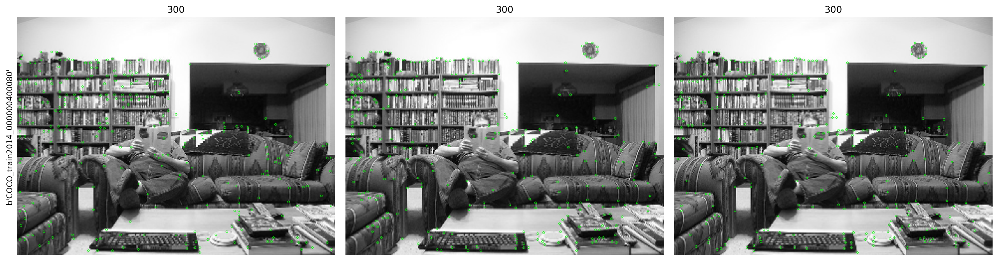

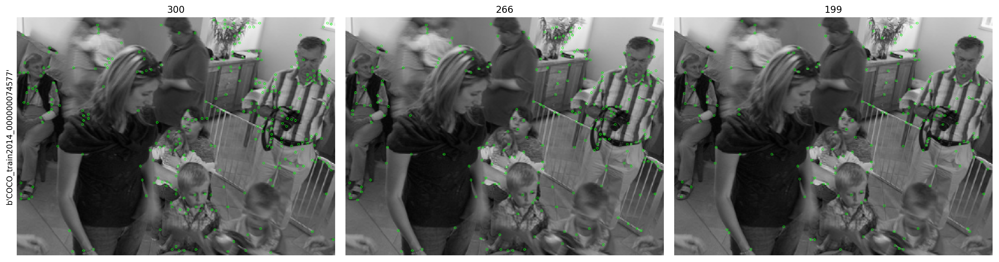

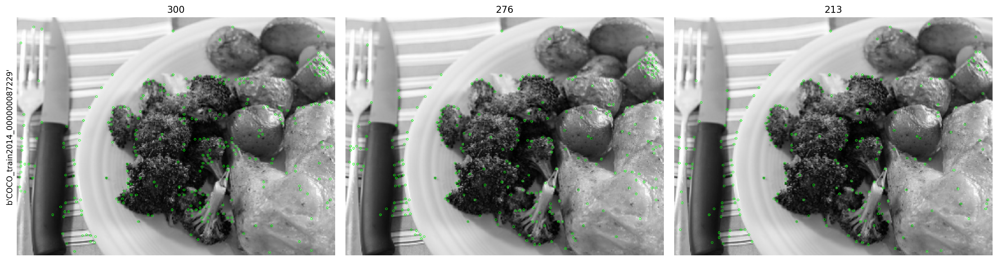

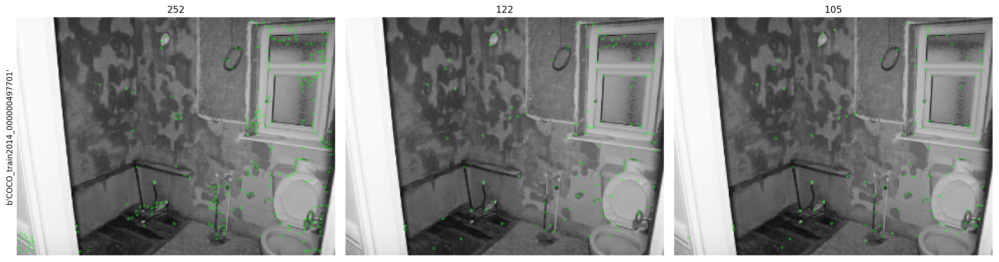

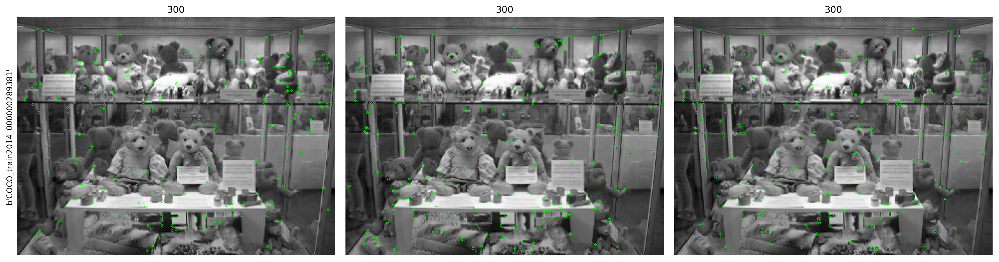

...

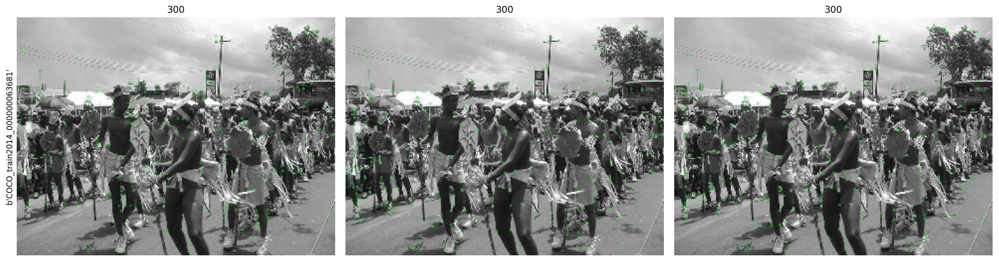

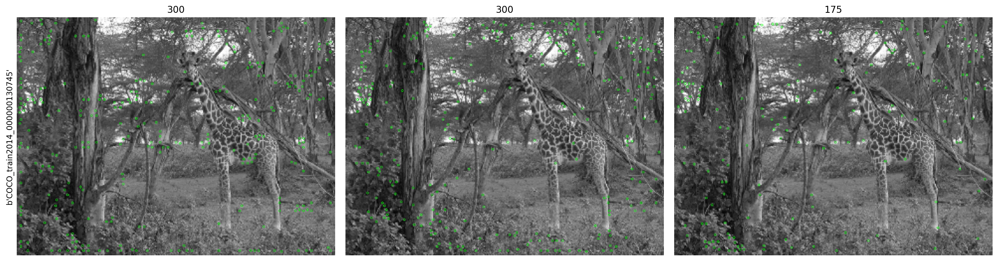

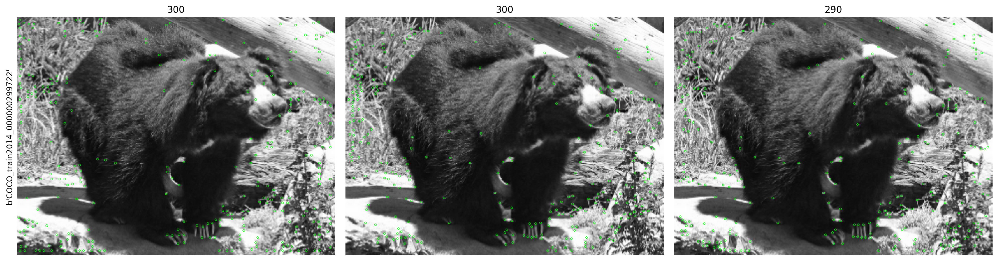

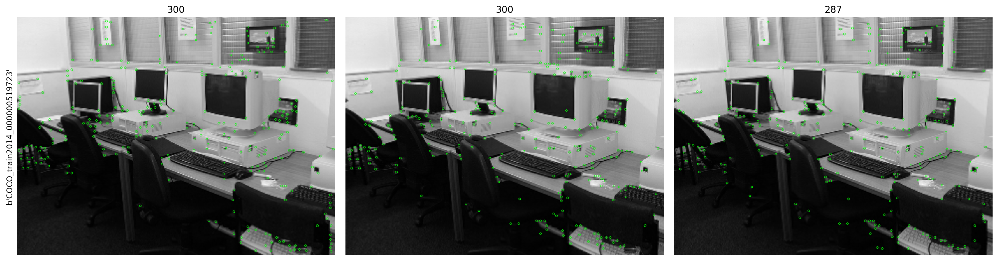

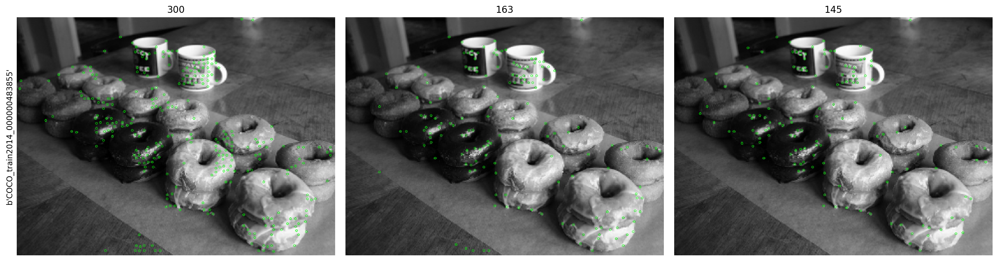

In [34]:
for i in range(15):
    images, titles = [], []
    for e, data in zip(experiments, datasets):
        d = next(data)
        images.append(draw_keypoints(d['image'][..., 0], np.where(d['keypoint_map']), (0, 255, 0))/255.)
        titles.append(len(d['keypoints']))
        name = d['name']
    plot_imgs(images, titles=titles, ylabel=name, dpi=200, cmap='gray')